# TM-scoring using USalign

Here we are going to explore how to use USalign to score the TM-score of protein
structures. We will implement this on our chimeric motors to explore the
differences in protein strurcture that might lead to different phenotypes in
ActiveDROPS. 

https://github.com/pylelab/USalign

In [1]:
import os
import subprocess
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select


· loading alignment …


/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warning


— full —


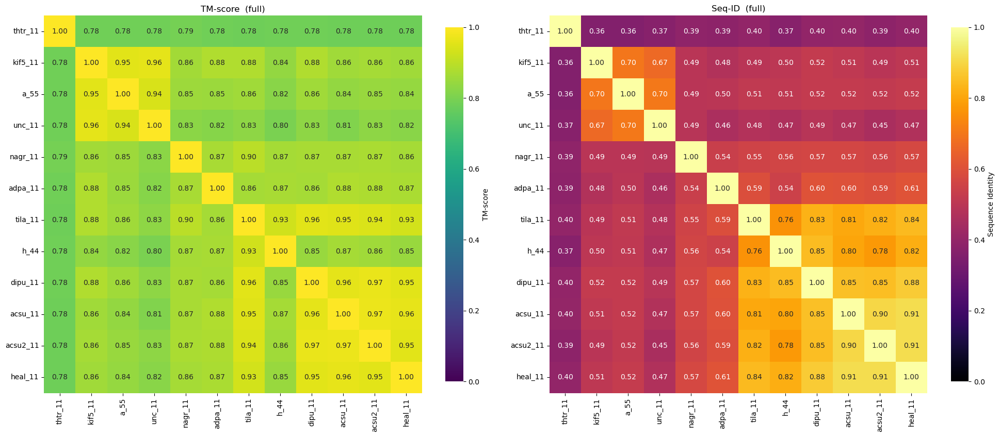


— module 1 —


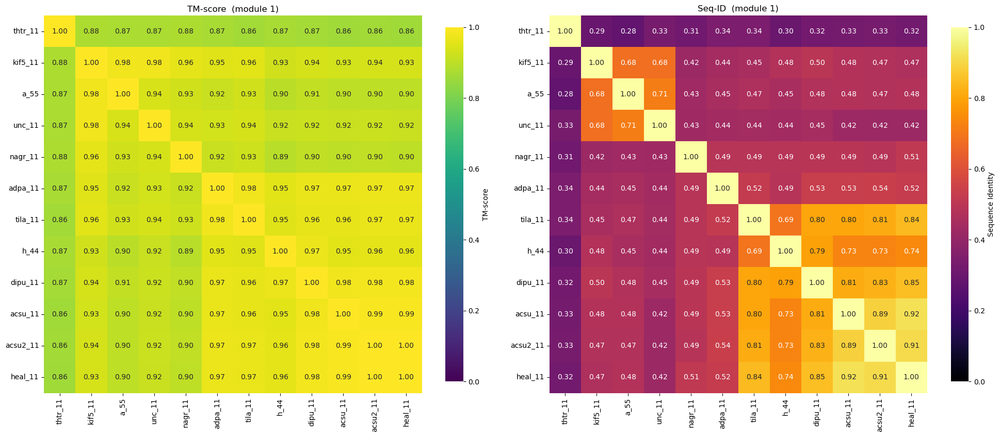


— module 2 —


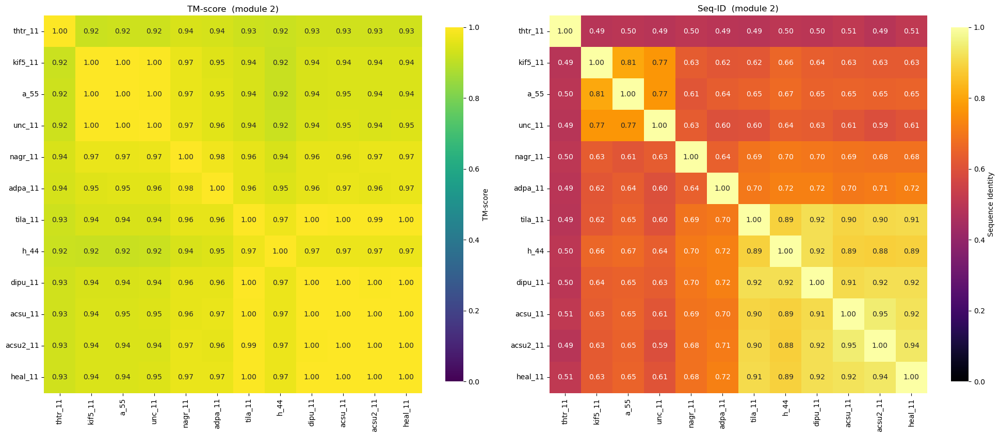


— module 3 —


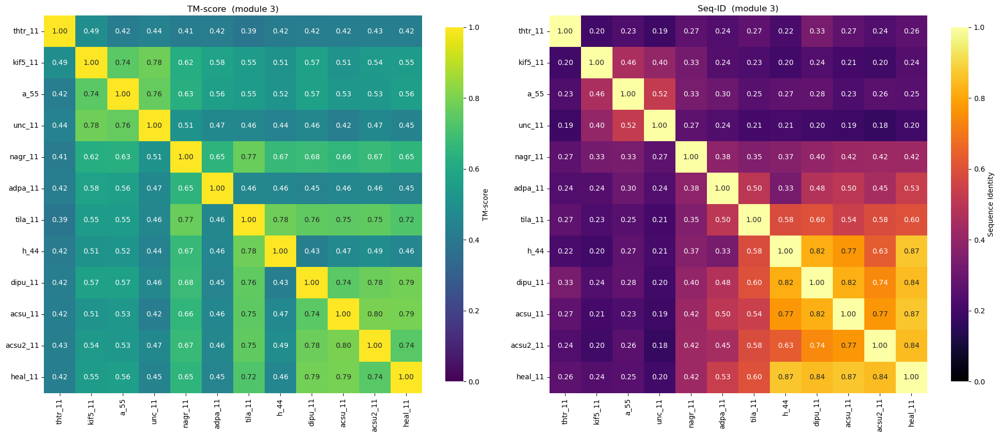


— module 1+2 —


KeyboardInterrupt: 

In [2]:
#!/usr/bin/env python3
"""
Kinesin‑domain TM‑score & sequence‑identity pipeline (FIXED for single-chain structures)
========================================================================================

* Reads a Clustal multiple alignment.
* Uses **a_55** as reference to map **modules** (1‑3) and **sub‑domains**.
* Enriches the alignment DataFrame (`ali_df`) with two extra columns:
      ‑  ali_df["Module"]    :  "module 1" / "module 2" / "module 3" / "-"
      ‑  ali_df["Subdomain"] :  the sub‑domain name (e.g. "b3‑ploop") or "-"
* The structural/heat‑map part is FIXED to handle single-chain structures.
* Works with structures that have any chain ID (not just "A").

Copy‑&‑paste ready.
"""

# ---------------------------------------------------------------------
#  0.  USER FILES & CONSTANTS
# ---------------------------------------------------------------------
import os, subprocess, functools, numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
from Bio import AlignIO
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select, Polypeptide

alignment_file = "../../../../Downloads/all"      # Clustal alignment
structure_paths = [

    # "../../data/3d_predictions/prodigy/monomer_predicted/ncd_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/thtr_11",
    # "../../data/3d_predictions/prodigy/monomer_predicted/popa_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/kif5_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/a_55",
    "../../data/3d_predictions/prodigy/monomer_predicted/unc_11",

    # "../../data/3d_predictions/prodigy/monomer_predicted/c_123",

    # "../../data/3d_predictions/prodigy/monomer_predicted/e_234",
    # "../../data/3d_predictions/prodigy/monomer_predicted/g_123",

    "../../data/3d_predictions/prodigy/monomer_predicted/nagr_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/adpa_11",

    "../../data/3d_predictions/prodigy/monomer_predicted/tila_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/h_44",
    "../../data/3d_predictions/prodigy/monomer_predicted/dipu_11",

    "../../data/3d_predictions/prodigy/monomer_predicted/acsu_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/acsu2_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/heal_11",


    # "../../data/3d_predictions/prodigy/monomer_predicted/b_345",
    # "../../data/3d_predictions/prodigy/monomer_predicted/d_55",

    # "../../data/3d_predictions/prodigy/monomer_predicted/f_456",

    # "../../data/3d_predictions/prodigy/blesto_11",
    # "../../data/3d_predictions/prodigy/blesto2_11",
]
ref_name = "a_55"                                    # reference sequence ID

# ---------------------------------------------------------------------
#  1.  DOMAIN & MODULE DEFINITIONS (UNGAPPED, REF = a_55)
# ---------------------------------------------------------------------
domain_def_ref = {
    # ---------- modules & full ---------------------------------------
    "full":       "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATE"
                  "RFVSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYL"
                  "VDLAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQ"
                  "ESLGGNARTTIVICCSPASFNESETKSTLDFGRRAKTVKNVVCVNEELTAEEWKRRYEKE"
                  "KEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL",
    "module 1":   "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATERF",
    "module 2":   "VSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYLVD"
                  "LAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQESL"
                  "GGNARTTIVICCSPASFNESETKSTLDFGRRAKTVK",
    "module 1+2":   "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATERFVSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYLVD"
                  "LAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQESL"
                  "GGNARTTIVICCSPASFNESETKSTLDFGRRAKTVK",
    "module 3":   "NVVCVNEELTAEEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDL"
                  "MEASTPNL",
    # ---------- sub‑domains ------------------------------------------
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5": "GVIGDSVKQG",
    "a2": "IIPRIVNDIFNHIYA",
    "b4": "LEFHIKVSYYEIY",
    "L8-b5": "KIRDLLDVSKVNLSVHEDKNRVPYV",
    "a3": "PEDVFEVIEEGKSNR",
    "L9-SwI": "HIAVTNMNEHSSRS",
    "b6": "HSVFLINVKQEN",
    "b7": "QKKLSGKLYLV",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12": "GNKTHIPYRDS",
    "a5": "KLTRILQES",
    "b8-a6": "RTTIVICC",
    "a6": "ESETKSTLDFGRRAKT",
    "neck": "VKNVVCVNEELTA",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}

# split dictionaries --------------------------------------------------
modules_def_ref  = {k: v for k, v in domain_def_ref.items()
                    if k in ("full", "module 1", "module 2", "module 3")}
subdom_def_ref   = {k: v for k, v in domain_def_ref.items()
                    if k not in modules_def_ref}

# ---------------------------------------------------------------------
#  2.  READ ALIGNMENT, MAP RANGES
# ---------------------------------------------------------------------
print("· loading alignment …")
ali = AlignIO.read(alignment_file, "clustal")
ali_df = pd.DataFrame({rec.id: list(str(rec.seq)) for rec in ali})
if ref_name not in ali_df.columns:
    raise ValueError(f"Reference '{ref_name}' missing from alignment.")

ref_gapped   = ali_df[ref_name].tolist()
ungapped_idx = [i for i, aa in enumerate(ref_gapped) if aa != "-"]
ref_ungapped = "".join(aa for aa in ref_gapped if aa != "-")

def map_ranges(def_dict):
    rng = {}
    for name, subseq in def_dict.items():
        u0 = ref_ungapped.find(subseq)
        if u0 == -1:
            raise ValueError(f"Cannot map '{name}'")
        g0 = ungapped_idx[u0]
        g1 = ungapped_idx[u0 + len(subseq) - 1]
        rng[name] = (g0, g1)
    return rng

module_ranges   = map_ranges({k: v for k, v in modules_def_ref.items()
                              if k != "full"})       # exclude "full"
subdom_ranges   = map_ranges(subdom_def_ref)
domain_ranges   = {**module_ranges, **subdom_ranges, "full": map_ranges({"full": modules_def_ref["full"]})["full"]}

# ---------------------------------------------------------------------
#  3.  ADD "Module" & "Subdomain" COLUMNS TO ali_df
# ---------------------------------------------------------------------
module_labels    = ["-"] * len(ref_gapped)
for mod, (g0, g1) in module_ranges.items():
    for i in range(g0, g1 + 1):
        module_labels[i] = mod

subdom_labels    = ["-"] * len(ref_gapped)
for sd, (g0, g1) in subdom_ranges.items():
    for i in range(g0, g1 + 1):
        subdom_labels[i] = sd

ali_df.insert(0, "Module",    module_labels)
ali_df.insert(1, "Subdomain", subdom_labels)

# ---------------------------------------------------------------------
#  4.  BUILD per‑protein DOMAIN SEQ DICT (ungapped)
# ---------------------------------------------------------------------
protein_dom_seq = {}
for prot in ali_df.columns[2:]:               # skip Module/Subdomain cols
    d = {}
    for dom, (g0, g1) in domain_ranges.items():
        d[dom] = "".join(ali_df.loc[g0:g1, prot]).replace("-", "")
    protein_dom_seq[prot] = d

domain_list = list(domain_ranges.keys())

# ---------------------------------------------------------------------
#  5.  STRUCTURE HELPERS (FIXED for single-chain structures)
# ---------------------------------------------------------------------
class Keep(Select):
    def __init__(self, keep, chain_id): 
        self.keep = keep
        self.chain_id = chain_id
    def accept_residue(self, r): 
        return r.get_parent().id == self.chain_id and r.get_id() in self.keep

def get_chain_sequence(path):
    """Get sequence from the first available chain (works for single-chain structures)"""
    # Attempt to open both .pdb and .cif versions
    pdb_path = path + ".pdb"
    cif_path = path + ".cif"
    
    if os.path.exists(pdb_path):
        parser = PDBParser(QUIET=True)
        s = parser.get_structure("s", pdb_path)
    elif os.path.exists(cif_path):
        parser = MMCIFParser(QUIET=True)
        s = parser.get_structure("s", cif_path)
    else:
        raise FileNotFoundError(f"Neither {pdb_path} nor {cif_path} found.")
    
    # Get all chains
    chains = list(s[0].get_chains())
    if not chains:
        raise ValueError(f"No chains found in {path}")
    
    # Use the first chain (for single-chain structures, this is the only chain)
    chain = chains[0]
    chain_id = chain.id
    
    seq, ids = [], []
    for res in chain:
        if Polypeptide.is_aa(res, standard=True):
            seq.append(Polypeptide.three_to_one(res.get_resname()))
            ids.append(res.get_id())
    
    return "".join(seq), ids, chain_id

def save_trim(src, dst, keep_ids, chain_id):
    # Attempt to open both .pdb and .cif versions
    pdb_src = src + ".pdb"
    cif_src = src + ".cif"
    
    if os.path.exists(pdb_src):
        parser = PDBParser(QUIET=True)
        s = parser.get_structure("s", pdb_src)
    elif os.path.exists(cif_src):
        parser = MMCIFParser(QUIET=True)
        s = parser.get_structure("s", cif_src)
    else:
        raise FileNotFoundError(f"Neither {pdb_src} nor {cif_src} found.")
    
    io = PDBIO()
    io.set_structure(s)
    io.save(dst, Keep(keep_ids, chain_id))

import functools, subprocess, numpy as np
@functools.lru_cache(maxsize=None)
def tm_score(p1, p2):
    out = subprocess.run(["USalign", p1, p2], stdout=subprocess.PIPE, text=True).stdout
    for ln in out.splitlines():
        if ln.startswith("TM-score="):
            try: return float(ln.split("=")[1].split()[0])
            except ValueError: break
    return np.nan

# ---------------------------------------------------------------------
#  6.  READ STRUCTURES
# ---------------------------------------------------------------------
structure_map = {os.path.splitext(os.path.basename(p))[0]: p for p in structure_paths}
structures    = [os.path.splitext(os.path.basename(p))[0] for p in structure_paths
                 if os.path.splitext(os.path.basename(p))[0] in protein_dom_seq]

# FIXED: Use the new function that returns chain_id as well
seq_cache     = {prot: get_chain_sequence(structure_map[prot]) for prot in structures}

# ---------------------------------------------------------------------
#  7.  MAIN LOOP – heat‑maps (FIXED logic)
# ---------------------------------------------------------------------
# Ensure "full" is the first domain to be processed
domain_list.remove("full")
domain_list.insert(0, "full")

# Create directory for saving SVG files
svg_output_dir = "../../../../Downloads/heatmaps_svg"
os.makedirs(svg_output_dir, exist_ok=True)

for dom in domain_list:
    print(f"\n— {dom} —")
    g0, g1 = domain_ranges[dom]
    dom_align = ali_df.loc[g0:g1, structures]        # slice with Module/Subdomain removed

    # ---------- trim structures --------------------------------------
    trimmed = {}
    for prot in structures:
        dom_seq = protein_dom_seq[prot][dom]
        full_seq, ids, chain_id = seq_cache[prot]  # FIXED: unpack chain_id
        idx = full_seq.find(dom_seq)
        if idx == -1:
            raise ValueError(f"{dom} not found in chain {chain_id} of {prot}")
        keep_ids = set(ids[idx : idx + len(dom_seq)])
        out_dir  = f"../../data/3d_predictions/prodigy/trimmed_segments/{dom}"
        os.makedirs(out_dir, exist_ok=True)
        out_pdb  = os.path.join(out_dir, f"{prot}_{dom}.pdb")
        save_trim(structure_map[prot], out_pdb, keep_ids, chain_id)  # FIXED: pass chain_id
        trimmed[prot] = out_pdb

    # ---------- matrices --------------------------------------------
    tm_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)
    id_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)

    for i, a in enumerate(structures):
        for j, b in enumerate(structures):
            if j < i:
                tm_mat.iat[i, j] = tm_mat.iat[j, i]
                id_mat.iat[i, j] = id_mat.iat[j, i]
                continue
            col_a, col_b = dom_align[a], dom_align[b]
            mask = (col_a != '-') & (col_b != '-')
            id_mat.iat[i, j] = ((col_a == col_b) & mask).sum() / mask.sum() if mask.any() else np.nan
            tm_mat.iat[i, j] = tm_score(trimmed[a], trimmed[b])

    # ---------- plot -------------------------------------------------
    plt.figure(figsize=(20, 9))
    plt.subplot(1, 2, 1)
    sns.heatmap(tm_mat, annot=True, fmt=".2f", cmap="viridis",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "TM‑score", "shrink": 0.8})
    plt.title(f"TM‑score  ({dom})")
    plt.subplot(1, 2, 2)
    sns.heatmap(id_mat, annot=True, fmt=".2f", cmap="inferno",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "Sequence Identity", "shrink": 0.8})
    plt.title(f"Seq‑ID  ({dom})")
    plt.tight_layout()
    
    # Save the plot as SVG
    svg_file_path = os.path.join(svg_output_dir, f"heatmap_{dom}.svg")
    plt.savefig(svg_file_path, format='svg')
    
    plt.show()

print("\n✓  Finished – trimmed PDBs in ../../data/3d_predictions/prodigy/trimmed_segments/<domain>/")
print(f"✓  Heatmaps saved as SVG in {svg_output_dir}")

# ---------------------------------------------------------------------
#  8.  OPTIONAL – inspect the enriched alignment DataFrame
# ---------------------------------------------------------------------
# print(ali_df.head(30))  # uncomment to preview Module / Subdomain labels

· loading alignment …


/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warning


— full —


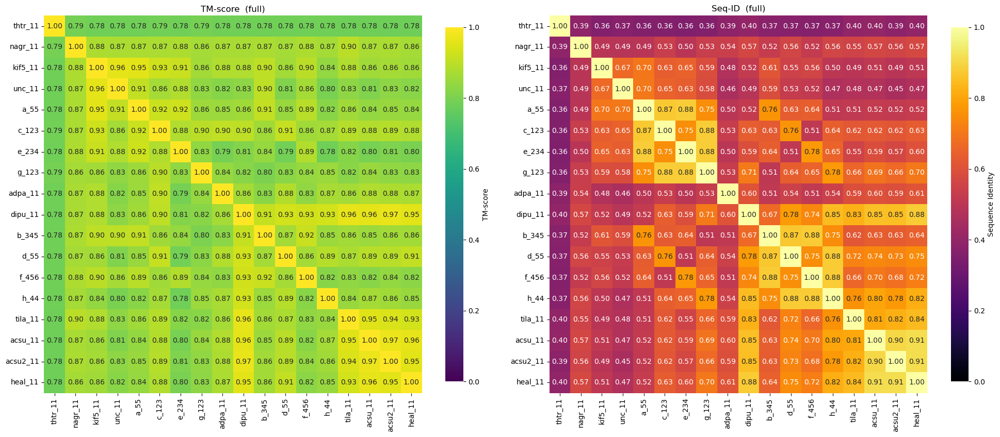


— module 1 —


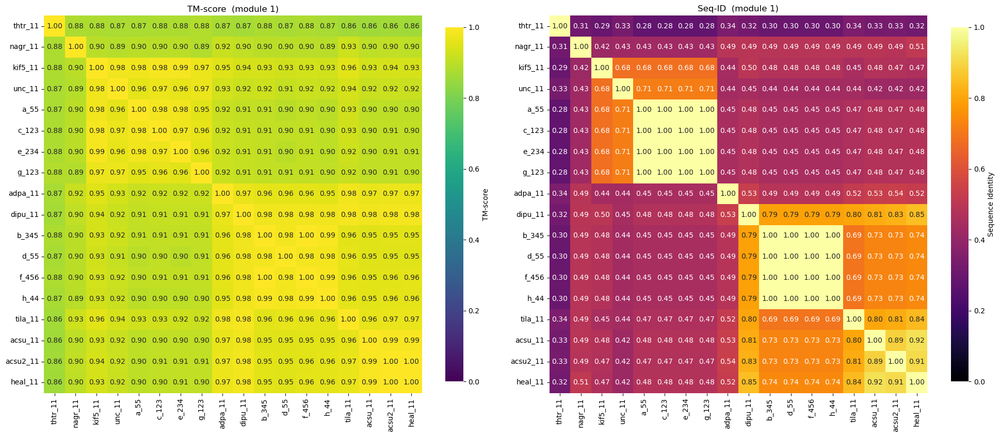


— module 2 —


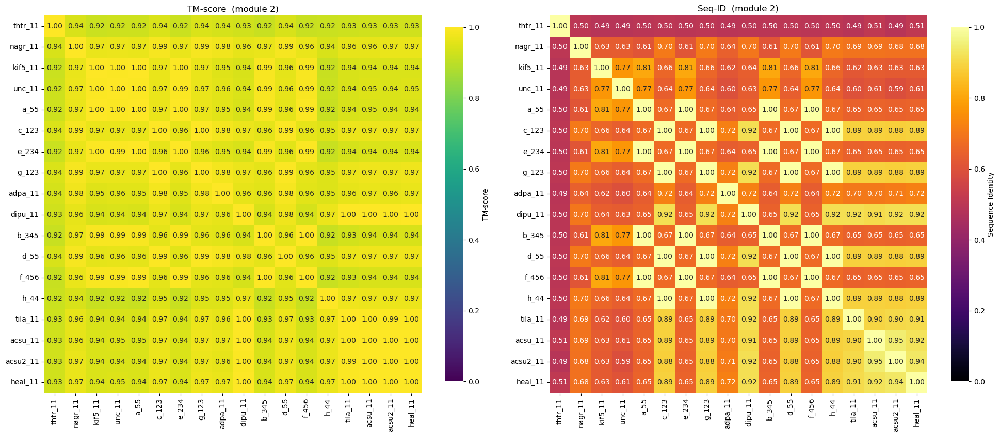


— module 3 —


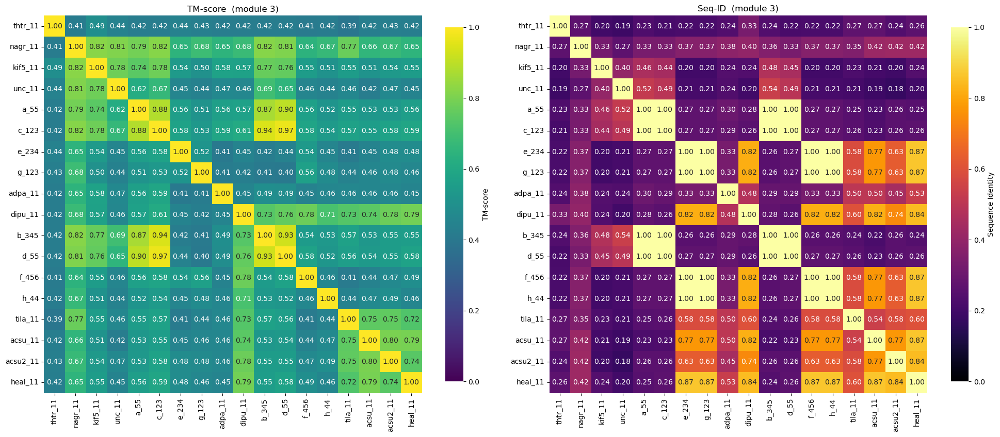


— module 1+2 —


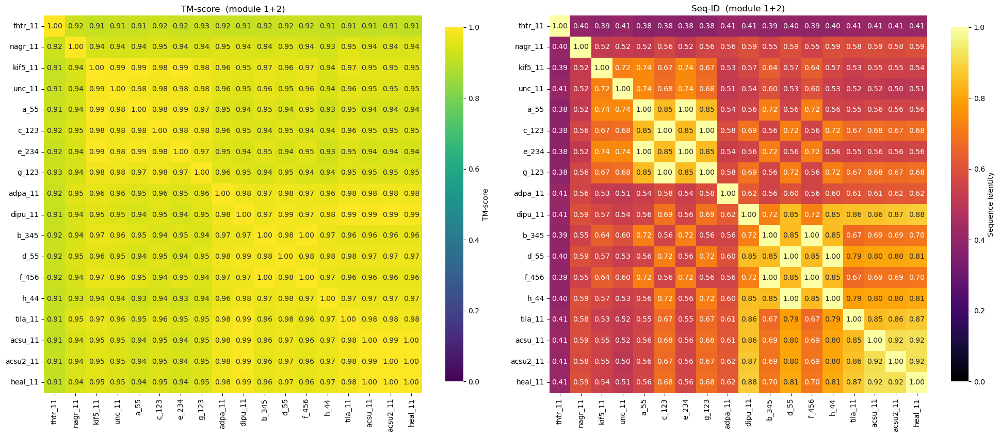


— b0-a0 —


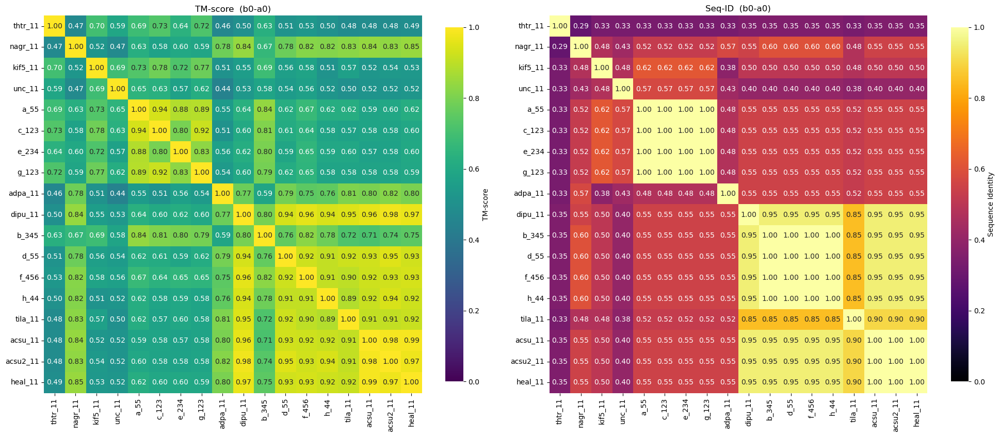


— b2 —


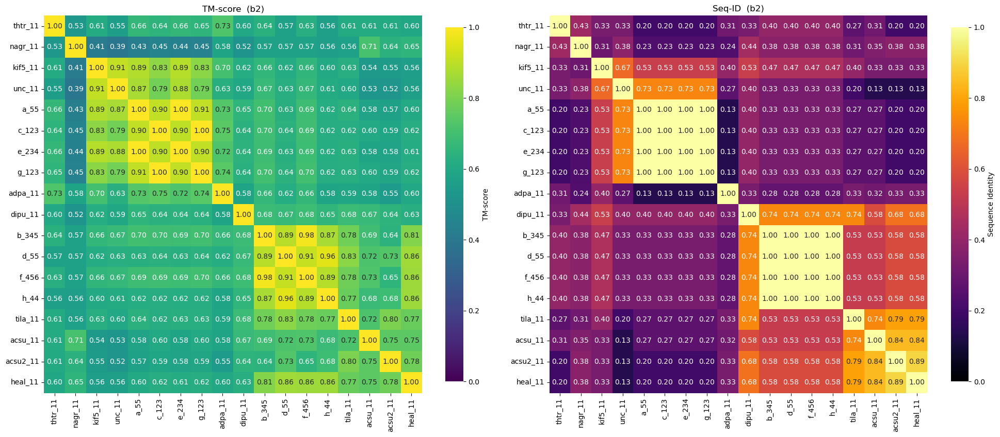


— a1 —


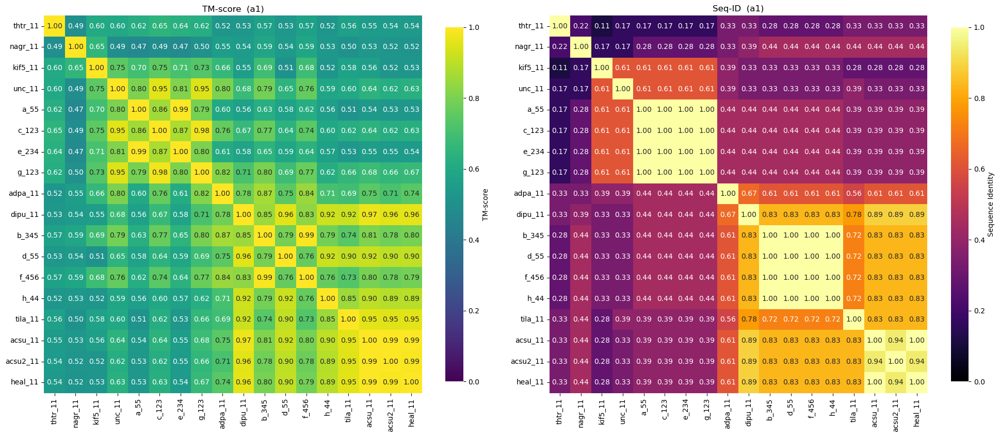


— b3-ploop —


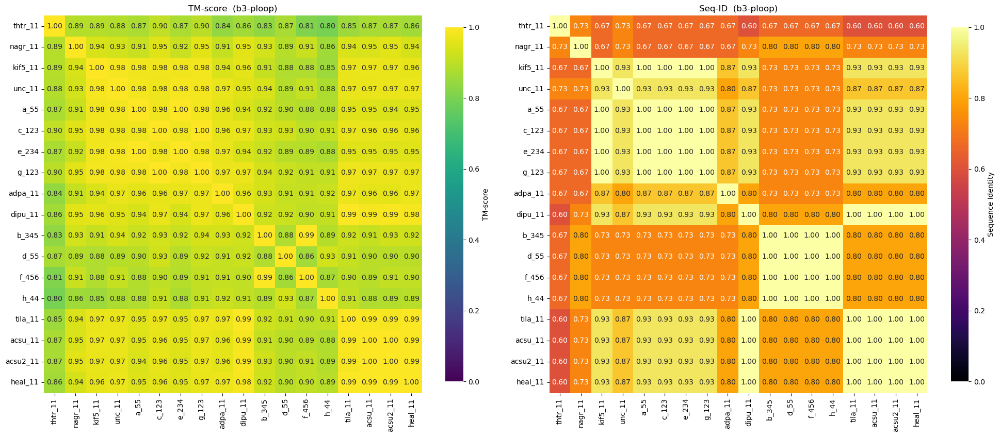


— L5 —


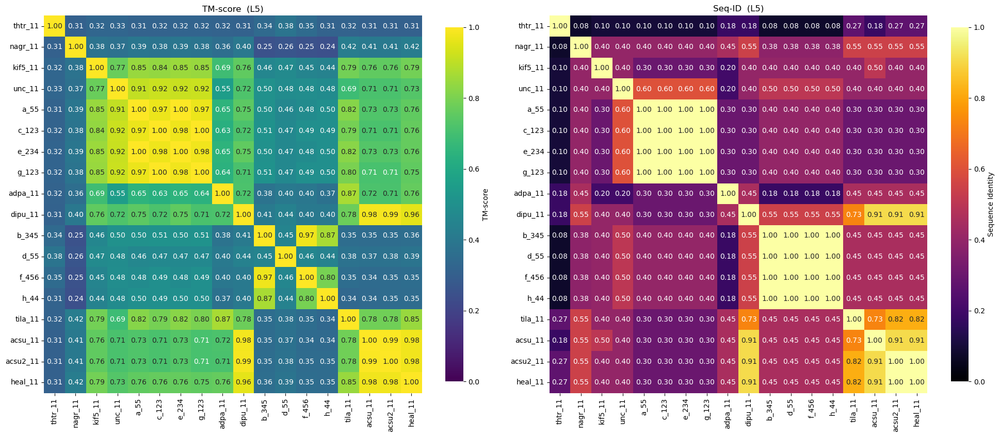


— a2 —


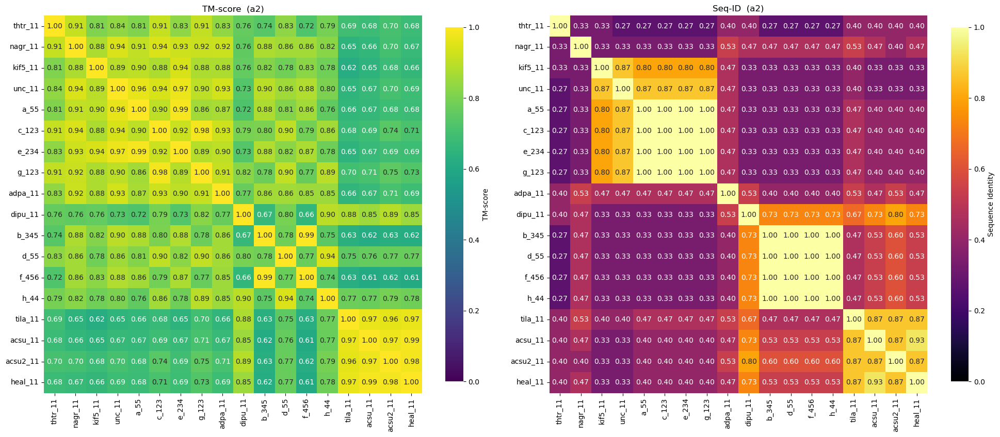


— b4 —


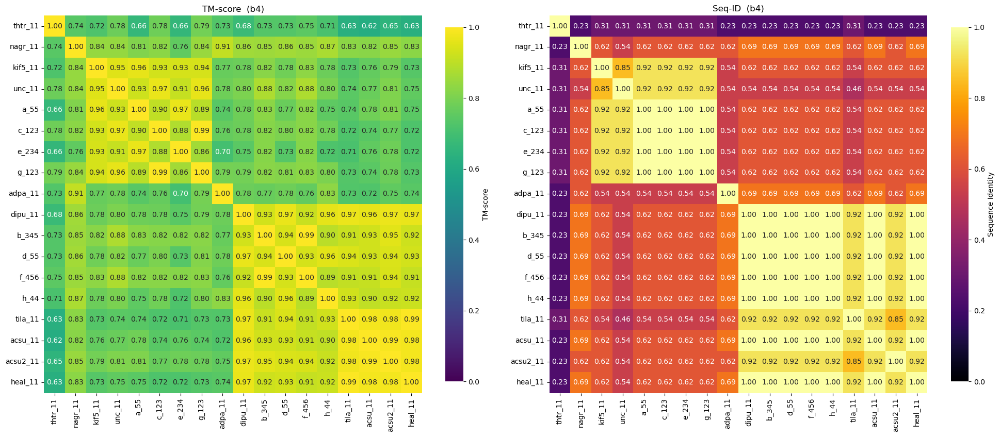


— L8-b5 —


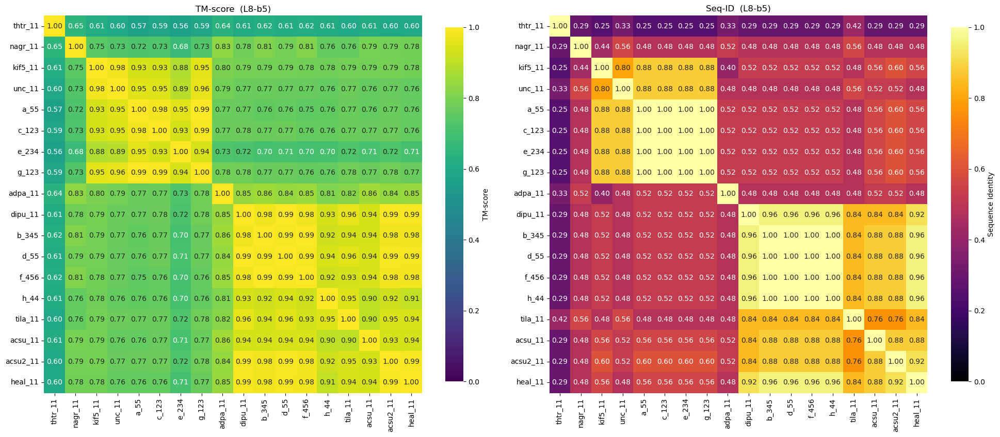


— a3 —


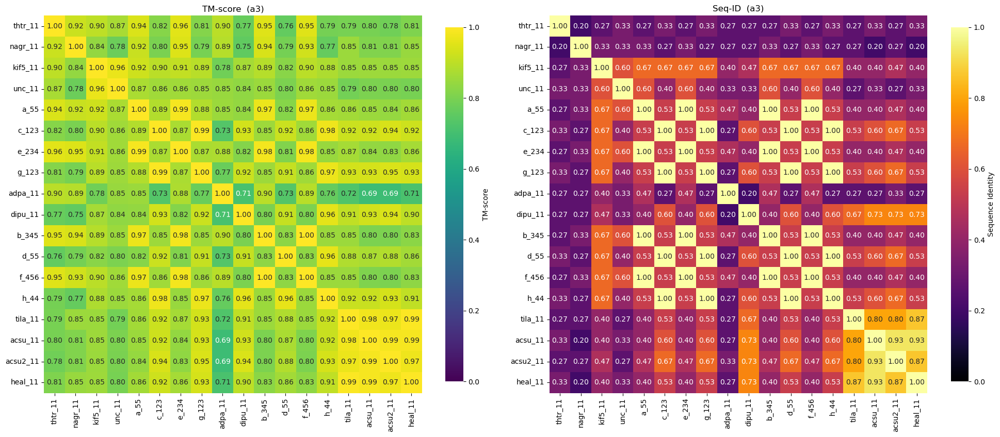


— L9-SwI —


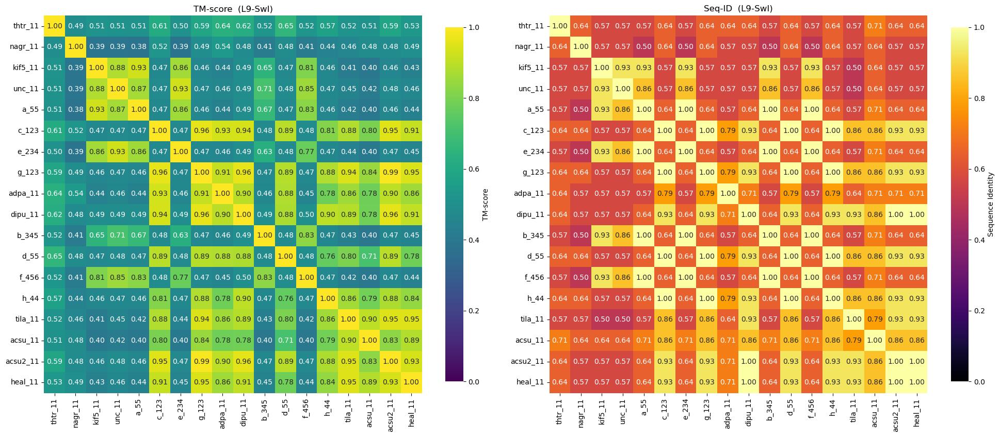


— b6 —


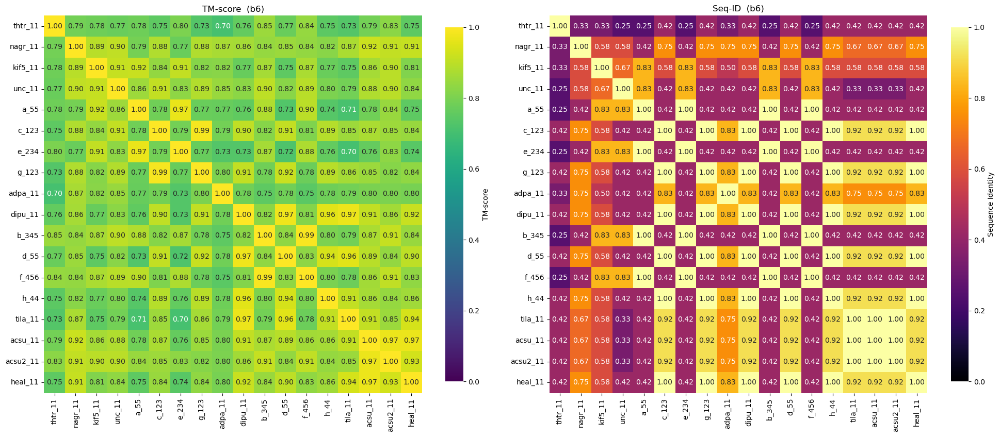


— b7 —


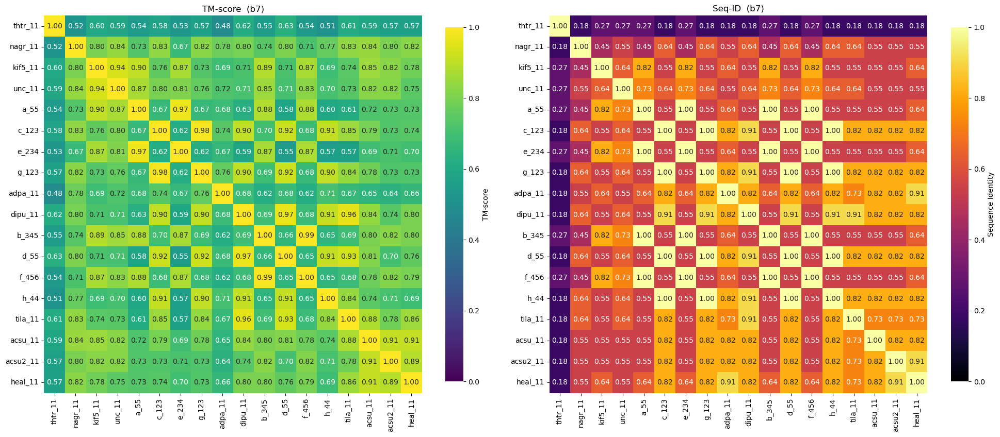


— L11-SwII —


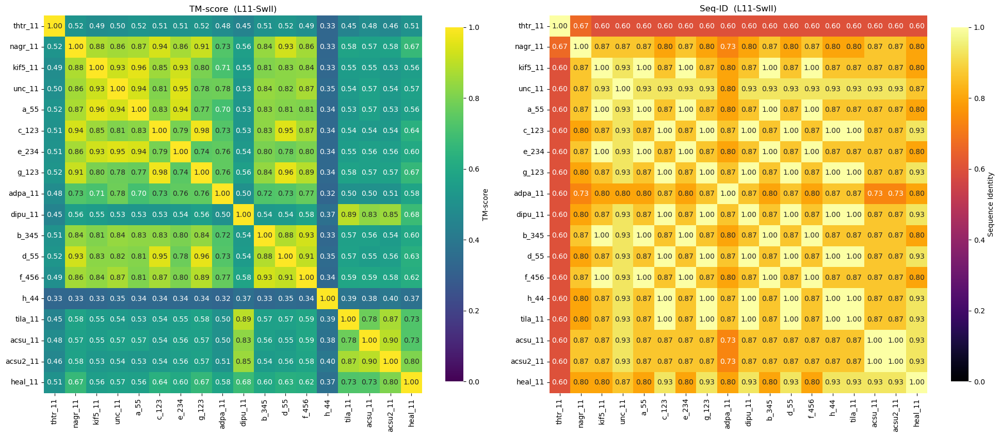


— a4 —


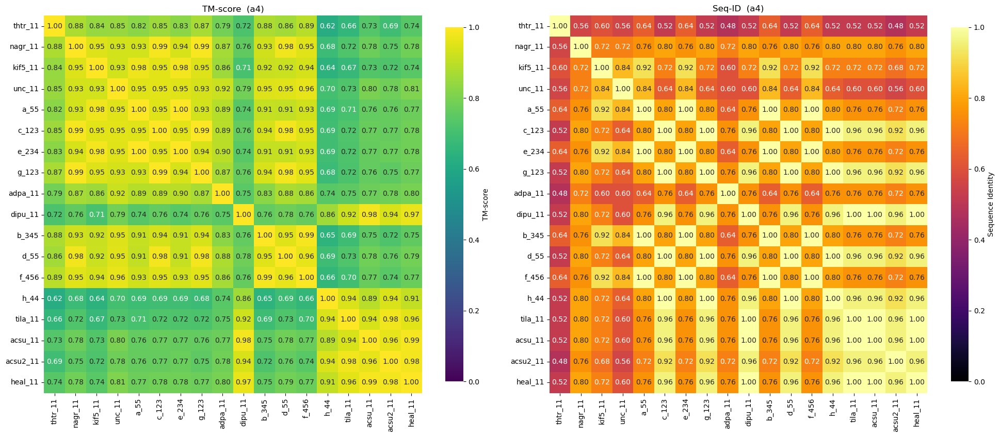


— L12 —


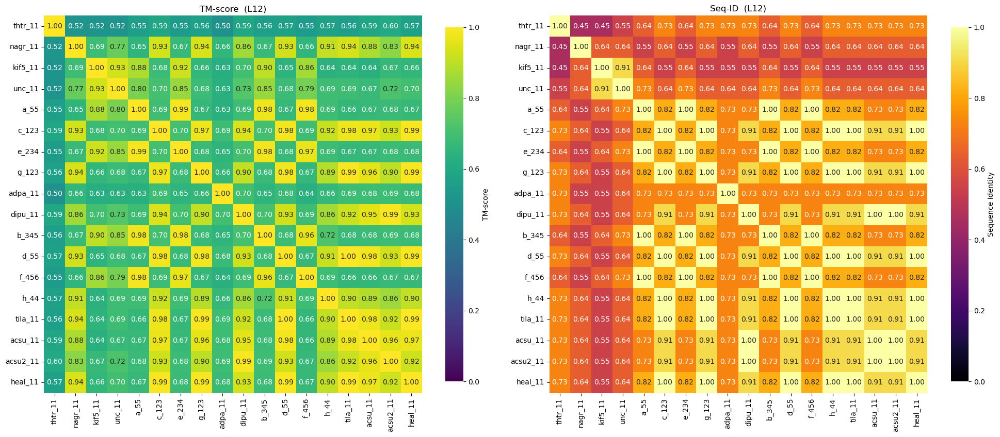


— a5 —


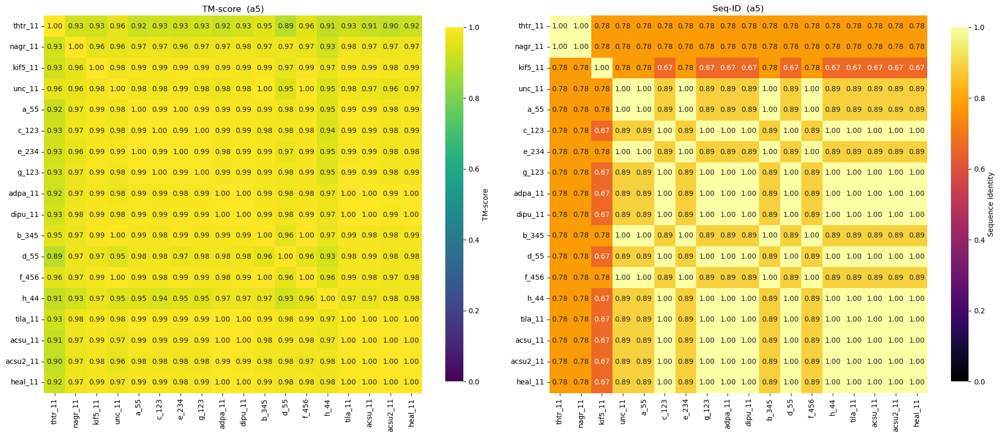


— b8-a6 —


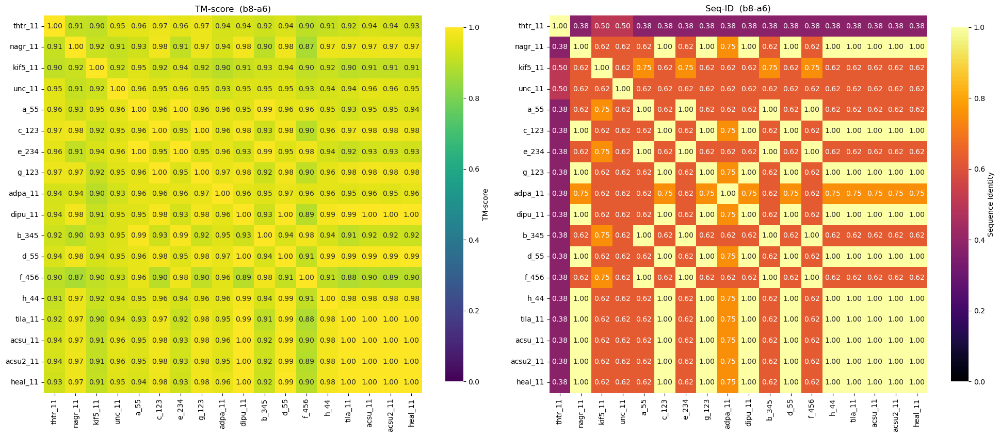


— a6 —


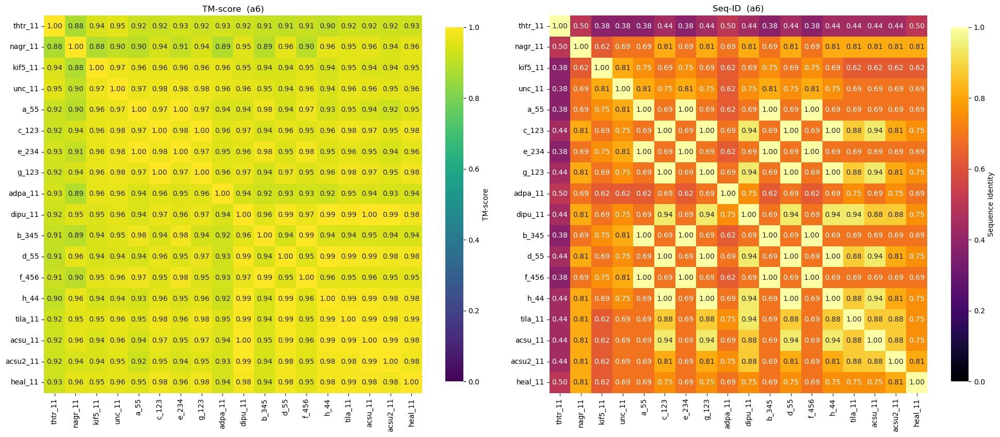


— neck —


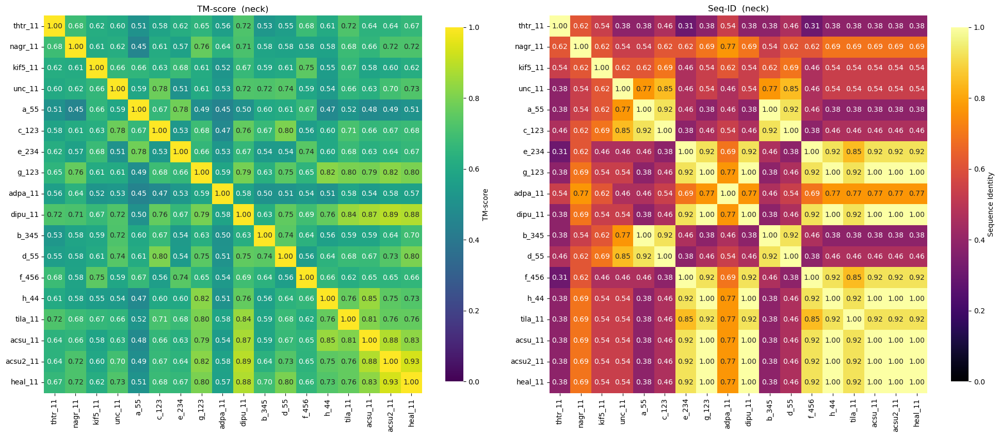


— coiled-coil —


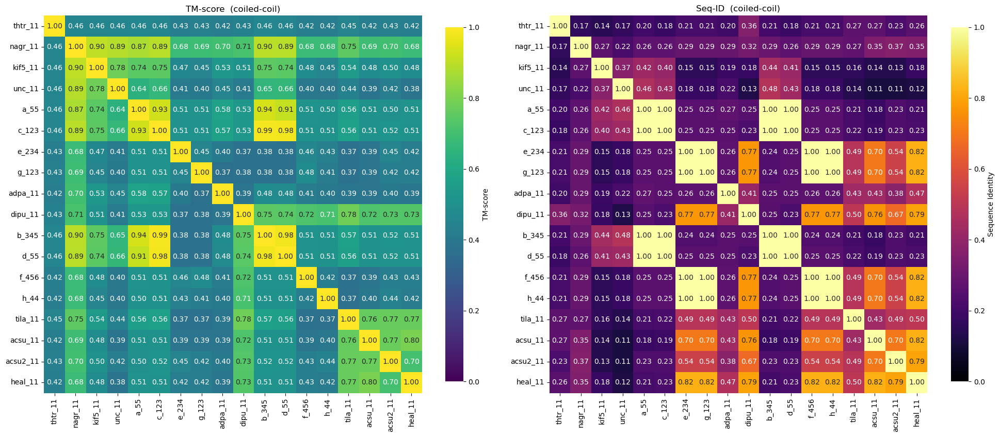


✓  Finished – trimmed PDBs in ../../data/3d_predictions/prodigy/trimmed_segments/<domain>/
✓  Heatmaps saved as SVG in ../../../../Downloads/heatmaps_svg


In [4]:
#!/usr/bin/env python3
"""
Kinesin‑domain TM‑score & sequence‑identity pipeline (FIXED for single-chain structures)
========================================================================================

* Reads a Clustal multiple alignment.
* Uses **a_55** as reference to map **modules** (1‑3) and **sub‑domains**.
* Enriches the alignment DataFrame (`ali_df`) with two extra columns:
      ‑  ali_df["Module"]    :  "module 1" / "module 2" / "module 3" / "-"
      ‑  ali_df["Subdomain"] :  the sub‑domain name (e.g. "b3‑ploop") or "-"
* The structural/heat‑map part is FIXED to handle single-chain structures.
* Works with structures that have any chain ID (not just "A").

Copy‑&‑paste ready.
"""

# ---------------------------------------------------------------------
#  0.  USER FILES & CONSTANTS
# ---------------------------------------------------------------------
import os, subprocess, functools, numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
from Bio import AlignIO
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select, Polypeptide

alignment_file = "../../../../Downloads/all"      # Clustal alignment
structure_paths = [

    # "../../data/3d_predictions/prodigy/monomer_predicted/ncd_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/thtr_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/nagr_11",
    # "../../data/3d_predictions/prodigy/monomer_predicted/popa_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/kif5_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/unc_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/a_55",

    "../../data/3d_predictions/prodigy/monomer_predicted/c_123",

    "../../data/3d_predictions/prodigy/monomer_predicted/e_234",
    "../../data/3d_predictions/prodigy/monomer_predicted/g_123",

    "../../data/3d_predictions/prodigy/monomer_predicted/adpa_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/dipu_11",

    "../../data/3d_predictions/prodigy/monomer_predicted/b_345",
    "../../data/3d_predictions/prodigy/monomer_predicted/d_55",

    "../../data/3d_predictions/prodigy/monomer_predicted/f_456",
    "../../data/3d_predictions/prodigy/monomer_predicted/h_44",

    "../../data/3d_predictions/prodigy/monomer_predicted/tila_11",

    "../../data/3d_predictions/prodigy/monomer_predicted/acsu_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/acsu2_11",
    "../../data/3d_predictions/prodigy/monomer_predicted/heal_11",



    # "../../data/3d_predictions/prodigy/blesto_11",
    # "../../data/3d_predictions/prodigy/blesto2_11",
]
ref_name = "a_55"                                    # reference sequence ID

# ---------------------------------------------------------------------
#  1.  DOMAIN & MODULE DEFINITIONS (UNGAPPED, REF = a_55)
# ---------------------------------------------------------------------
domain_def_ref = {
    # ---------- modules & full ---------------------------------------
    "full":       "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATE"
                  "RFVSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYL"
                  "VDLAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQ"
                  "ESLGGNARTTIVICCSPASFNESETKSTLDFGRRAKTVKNVVCVNEELTAEEWKRRYEKE"
                  "KEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL",
    "module 1":   "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATERF",
    "module 2":   "VSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYLVD"
                  "LAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQESL"
                  "GGNARTTIVICCSPASFNESETKSTLDFGRRAKTVK",
    "module 1+2":   "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATERFVSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYLVD"
                  "LAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQESL"
                  "GGNARTTIVICCSPASFNESETKSTLDFGRRAKTVK",
    "module 3":   "NVVCVNEELTAEEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDL"
                  "MEASTPNL",
    # ---------- sub‑domains ------------------------------------------
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5": "GVIGDSVKQG",
    "a2": "IIPRIVNDIFNHIYA",
    "b4": "LEFHIKVSYYEIY",
    "L8-b5": "KIRDLLDVSKVNLSVHEDKNRVPYV",
    "a3": "PEDVFEVIEEGKSNR",
    "L9-SwI": "HIAVTNMNEHSSRS",
    "b6": "HSVFLINVKQEN",
    "b7": "QKKLSGKLYLV",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12": "GNKTHIPYRDS",
    "a5": "KLTRILQES",
    "b8-a6": "RTTIVICC",
    "a6": "ESETKSTLDFGRRAKT",
    "neck": "VKNVVCVNEELTA",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}

# split dictionaries --------------------------------------------------
modules_def_ref  = {k: v for k, v in domain_def_ref.items()
                    if k in ("full", "module 1", "module 2", "module 3")}
subdom_def_ref   = {k: v for k, v in domain_def_ref.items()
                    if k not in modules_def_ref}

# ---------------------------------------------------------------------
#  2.  READ ALIGNMENT, MAP RANGES
# ---------------------------------------------------------------------
print("· loading alignment …")
ali = AlignIO.read(alignment_file, "clustal")
ali_df = pd.DataFrame({rec.id: list(str(rec.seq)) for rec in ali})
if ref_name not in ali_df.columns:
    raise ValueError(f"Reference '{ref_name}' missing from alignment.")

ref_gapped   = ali_df[ref_name].tolist()
ungapped_idx = [i for i, aa in enumerate(ref_gapped) if aa != "-"]
ref_ungapped = "".join(aa for aa in ref_gapped if aa != "-")

def map_ranges(def_dict):
    rng = {}
    for name, subseq in def_dict.items():
        u0 = ref_ungapped.find(subseq)
        if u0 == -1:
            raise ValueError(f"Cannot map '{name}'")
        g0 = ungapped_idx[u0]
        g1 = ungapped_idx[u0 + len(subseq) - 1]
        rng[name] = (g0, g1)
    return rng

module_ranges   = map_ranges({k: v for k, v in modules_def_ref.items()
                              if k != "full"})       # exclude "full"
subdom_ranges   = map_ranges(subdom_def_ref)
domain_ranges   = {**module_ranges, **subdom_ranges, "full": map_ranges({"full": modules_def_ref["full"]})["full"]}

# ---------------------------------------------------------------------
#  3.  ADD "Module" & "Subdomain" COLUMNS TO ali_df
# ---------------------------------------------------------------------
module_labels    = ["-"] * len(ref_gapped)
for mod, (g0, g1) in module_ranges.items():
    for i in range(g0, g1 + 1):
        module_labels[i] = mod

subdom_labels    = ["-"] * len(ref_gapped)
for sd, (g0, g1) in subdom_ranges.items():
    for i in range(g0, g1 + 1):
        subdom_labels[i] = sd

ali_df.insert(0, "Module",    module_labels)
ali_df.insert(1, "Subdomain", subdom_labels)

# ---------------------------------------------------------------------
#  4.  BUILD per‑protein DOMAIN SEQ DICT (ungapped)
# ---------------------------------------------------------------------
protein_dom_seq = {}
for prot in ali_df.columns[2:]:               # skip Module/Subdomain cols
    d = {}
    for dom, (g0, g1) in domain_ranges.items():
        d[dom] = "".join(ali_df.loc[g0:g1, prot]).replace("-", "")
    protein_dom_seq[prot] = d

domain_list = list(domain_ranges.keys())

# ---------------------------------------------------------------------
#  5.  STRUCTURE HELPERS (FIXED for single-chain structures)
# ---------------------------------------------------------------------
class Keep(Select):
    def __init__(self, keep, chain_id): 
        self.keep = keep
        self.chain_id = chain_id
    def accept_residue(self, r): 
        return r.get_parent().id == self.chain_id and r.get_id() in self.keep

def get_chain_sequence(path):
    """Get sequence from the first available chain (works for single-chain structures)"""
    # Attempt to open both .pdb and .cif versions
    pdb_path = path + ".pdb"
    cif_path = path + ".cif"
    
    if os.path.exists(pdb_path):
        parser = PDBParser(QUIET=True)
        s = parser.get_structure("s", pdb_path)
    elif os.path.exists(cif_path):
        parser = MMCIFParser(QUIET=True)
        s = parser.get_structure("s", cif_path)
    else:
        raise FileNotFoundError(f"Neither {pdb_path} nor {cif_path} found.")
    
    # Get all chains
    chains = list(s[0].get_chains())
    if not chains:
        raise ValueError(f"No chains found in {path}")
    
    # Use the first chain (for single-chain structures, this is the only chain)
    chain = chains[0]
    chain_id = chain.id
    
    seq, ids = [], []
    for res in chain:
        if Polypeptide.is_aa(res, standard=True):
            seq.append(Polypeptide.three_to_one(res.get_resname()))
            ids.append(res.get_id())
    
    return "".join(seq), ids, chain_id

def save_trim(src, dst, keep_ids, chain_id):
    # Attempt to open both .pdb and .cif versions
    pdb_src = src + ".pdb"
    cif_src = src + ".cif"
    
    if os.path.exists(pdb_src):
        parser = PDBParser(QUIET=True)
        s = parser.get_structure("s", pdb_src)
    elif os.path.exists(cif_src):
        parser = MMCIFParser(QUIET=True)
        s = parser.get_structure("s", cif_src)
    else:
        raise FileNotFoundError(f"Neither {pdb_src} nor {cif_src} found.")
    
    io = PDBIO()
    io.set_structure(s)
    io.save(dst, Keep(keep_ids, chain_id))

import functools, subprocess, numpy as np
@functools.lru_cache(maxsize=None)
def tm_score(p1, p2):
    out = subprocess.run(["USalign", p1, p2], stdout=subprocess.PIPE, text=True).stdout
    for ln in out.splitlines():
        if ln.startswith("TM-score="):
            try: return float(ln.split("=")[1].split()[0])
            except ValueError: break
    return np.nan

# ---------------------------------------------------------------------
#  6.  READ STRUCTURES
# ---------------------------------------------------------------------
structure_map = {os.path.splitext(os.path.basename(p))[0]: p for p in structure_paths}
structures    = [os.path.splitext(os.path.basename(p))[0] for p in structure_paths
                 if os.path.splitext(os.path.basename(p))[0] in protein_dom_seq]

# FIXED: Use the new function that returns chain_id as well
seq_cache     = {prot: get_chain_sequence(structure_map[prot]) for prot in structures}

# ---------------------------------------------------------------------
#  7.  MAIN LOOP – heat‑maps (FIXED logic)
# ---------------------------------------------------------------------
# Ensure "full" is the first domain to be processed
domain_list.remove("full")
domain_list.insert(0, "full")

# Create directory for saving SVG files
svg_output_dir = "../../../../Downloads/heatmaps_svg"
os.makedirs(svg_output_dir, exist_ok=True)

for dom in domain_list:
    print(f"\n— {dom} —")
    g0, g1 = domain_ranges[dom]
    dom_align = ali_df.loc[g0:g1, structures]        # slice with Module/Subdomain removed

    # ---------- trim structures --------------------------------------
    trimmed = {}
    for prot in structures:
        dom_seq = protein_dom_seq[prot][dom]
        full_seq, ids, chain_id = seq_cache[prot]  # FIXED: unpack chain_id
        idx = full_seq.find(dom_seq)
        if idx == -1:
            raise ValueError(f"{dom} not found in chain {chain_id} of {prot}")
        keep_ids = set(ids[idx : idx + len(dom_seq)])
        out_dir  = f"../../data/3d_predictions/prodigy/trimmed_segments/{dom}"
        os.makedirs(out_dir, exist_ok=True)
        out_pdb  = os.path.join(out_dir, f"{prot}_{dom}.pdb")
        save_trim(structure_map[prot], out_pdb, keep_ids, chain_id)  # FIXED: pass chain_id
        trimmed[prot] = out_pdb

    # ---------- matrices --------------------------------------------
    tm_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)
    id_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)

    for i, a in enumerate(structures):
        for j, b in enumerate(structures):
            if j < i:
                tm_mat.iat[i, j] = tm_mat.iat[j, i]
                id_mat.iat[i, j] = id_mat.iat[j, i]
                continue
            col_a, col_b = dom_align[a], dom_align[b]
            mask = (col_a != '-') & (col_b != '-')
            id_mat.iat[i, j] = ((col_a == col_b) & mask).sum() / mask.sum() if mask.any() else np.nan
            tm_mat.iat[i, j] = tm_score(trimmed[a], trimmed[b])

    # ---------- plot -------------------------------------------------
    plt.figure(figsize=(20, 9))
    plt.subplot(1, 2, 1)
    sns.heatmap(tm_mat, annot=True, fmt=".2f", cmap="viridis",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "TM‑score", "shrink": 0.8})
    plt.title(f"TM‑score  ({dom})")
    plt.subplot(1, 2, 2)
    sns.heatmap(id_mat, annot=True, fmt=".2f", cmap="inferno",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "Sequence Identity", "shrink": 0.8})
    plt.title(f"Seq‑ID  ({dom})")
    plt.tight_layout()
    
    # Save the plot as SVG
    svg_file_path = os.path.join(svg_output_dir, f"heatmap_{dom}.svg")
    plt.savefig(svg_file_path, format='svg')
    
    plt.show()

print("\n✓  Finished – trimmed PDBs in ../../data/3d_predictions/prodigy/trimmed_segments/<domain>/")
print(f"✓  Heatmaps saved as SVG in {svg_output_dir}")

# ---------------------------------------------------------------------
#  8.  OPTIONAL – inspect the enriched alignment DataFrame
# ---------------------------------------------------------------------
# print(ali_df.head(30))  # uncomment to preview Module / Subdomain labels

In [ ]:
#!/usr/bin/env python3
"""
Kinesin‑domain TM‑score & sequence‑identity pipeline (FIXED for single-chain structures)
========================================================================================

* Reads a Clustal multiple alignment.
* Uses **a_55** as reference to map **modules** (1‑3) and **sub‑domains**.
* Enriches the alignment DataFrame (`ali_df`) with two extra columns:
      ‑  ali_df["Module"]    :  "module 1" / "module 2" / "module 3" / "-"
      ‑  ali_df["Subdomain"] :  the sub‑domain name (e.g. "b3‑ploop") or "-"
* The structural/heat‑map part is FIXED to handle single-chain structures.
* Works with structures that have any chain ID (not just "A").

Copy‑&‑paste ready.
"""

# ---------------------------------------------------------------------
#  0.  USER FILES & CONSTANTS
# ---------------------------------------------------------------------
import os, subprocess, functools, numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
from Bio import AlignIO
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select, Polypeptide

alignment_file = "../../../../Downloads/all"      # Clustal alignment
structure_paths = [

    # "../../data/3d_predictions/prodigy/monomer_predicted/ncd_11",
    # "../../data/3d_predictions/prodigy/popa_11",
    "../../data/3d_predictions/prodigy/thtr_11",

    "../../data/3d_predictions/prodigy/kif5_11",
    "../../data/3d_predictions/prodigy/unc_11",
    "../../data/3d_predictions/prodigy/a_55",

    "../../data/3d_predictions/prodigy/c_123",

    "../../data/3d_predictions/prodigy/e_234",
    "../../data/3d_predictions/prodigy/g_123",

    "../../data/3d_predictions/prodigy/nagr_11",
    "../../data/3d_predictions/prodigy/adpa_11",

    "../../data/3d_predictions/prodigy/tila_11",


    "../../data/3d_predictions/prodigy/acsu_11",
    "../../data/3d_predictions/prodigy/acsu2_11",
    "../../data/3d_predictions/prodigy/heal_11",

    "../../data/3d_predictions/prodigy/dipu_11",


    "../../data/3d_predictions/prodigy/b_345",
    "../../data/3d_predictions/prodigy/d_55",

    "../../data/3d_predictions/prodigy/f_456",
    "../../data/3d_predictions/prodigy/h_44",

    # "../../data/3d_predictions/prodigy/blesto_11",
    # "../../data/3d_predictions/prodigy/blesto2_11",
]
ref_name = "a_55"                                    # reference sequence ID

# ---------------------------------------------------------------------
#  1.  DOMAIN & MODULE DEFINITIONS (UNGAPPED, REF = a_55)
# ---------------------------------------------------------------------
domain_def_ref = {
    # ---------- modules & full ---------------------------------------
    "full":       "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATE"
                  "RFVSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYL"
                  "VDLAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQ"
                  "ESLGGNARTTIVICCSPASFNESETKSTLDFGRRAKTVKNVVCVNEELTAEEWKRRYEKE"
                  "KEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL",
    "module 1":   "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATERF",
    "module 2":   "VSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYLVD"
                  "LAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQESL"
                  "GGNARTTIVICCSPASFNESETKSTLDFGRRAKTVK",
    "module 1+2":   "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATERFVSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYLVD"
                  "LAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQESL"
                  "GGNARTTIVICCSPASFNESETKSTLDFGRRAKTVK",
    "module 3":   "NVVCVNEELTAEEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDL"
                  "MEASTPNL",
    # ---------- sub‑domains ------------------------------------------
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5": "GVIGDSVKQG",
    "a2": "IIPRIVNDIFNHIYA",
    "b4": "LEFHIKVSYYEIY",
    "L8-b5": "KIRDLLDVSKVNLSVHEDKNRVPYV",
    "a3": "PEDVFEVIEEGKSNR",
    "L9-SwI": "HIAVTNMNEHSSRS",
    "b6": "HSVFLINVKQEN",
    "b7": "QKKLSGKLYLV",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12": "DGNKTHIPYRDS",
    "a5": "KLTRILQES",
    "b8-a6": "RTTIVICC",
    "a6": "ESETKSTLDFGRRAKT",
    "neck": "VKNVVCVNEELTA",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}

# split dictionaries --------------------------------------------------
modules_def_ref  = {k: v for k, v in domain_def_ref.items()
                    if k in ("full", "module 1", "module 2", "module 3")}
subdom_def_ref   = {k: v for k, v in domain_def_ref.items()
                    if k not in modules_def_ref}

# ---------------------------------------------------------------------
#  2.  READ ALIGNMENT, MAP RANGES
# ---------------------------------------------------------------------
print("· loading alignment …")
ali = AlignIO.read(alignment_file, "clustal")
ali_df = pd.DataFrame({rec.id: list(str(rec.seq)) for rec in ali})
if ref_name not in ali_df.columns:
    raise ValueError(f"Reference '{ref_name}' missing from alignment.")

ref_gapped   = ali_df[ref_name].tolist()
ungapped_idx = [i for i, aa in enumerate(ref_gapped) if aa != "-"]
ref_ungapped = "".join(aa for aa in ref_gapped if aa != "-")

def map_ranges(def_dict):
    rng = {}
    for name, subseq in def_dict.items():
        u0 = ref_ungapped.find(subseq)
        if u0 == -1:
            raise ValueError(f"Cannot map '{name}'")
        g0 = ungapped_idx[u0]
        g1 = ungapped_idx[u0 + len(subseq) - 1]
        rng[name] = (g0, g1)
    return rng

module_ranges   = map_ranges({k: v for k, v in modules_def_ref.items()
                              if k != "full"})       # exclude "full"
subdom_ranges   = map_ranges(subdom_def_ref)
domain_ranges   = {**module_ranges, **subdom_ranges, "full": map_ranges({"full": modules_def_ref["full"]})["full"]}

# ---------------------------------------------------------------------
#  3.  ADD "Module" & "Subdomain" COLUMNS TO ali_df
# ---------------------------------------------------------------------
module_labels    = ["-"] * len(ref_gapped)
for mod, (g0, g1) in module_ranges.items():
    for i in range(g0, g1 + 1):
        module_labels[i] = mod

subdom_labels    = ["-"] * len(ref_gapped)
for sd, (g0, g1) in subdom_ranges.items():
    for i in range(g0, g1 + 1):
        subdom_labels[i] = sd

ali_df.insert(0, "Module",    module_labels)
ali_df.insert(1, "Subdomain", subdom_labels)

# ---------------------------------------------------------------------
#  4.  BUILD per‑protein DOMAIN SEQ DICT (ungapped)
# ---------------------------------------------------------------------
protein_dom_seq = {}
for prot in ali_df.columns[2:]:               # skip Module/Subdomain cols
    d = {}
    for dom, (g0, g1) in domain_ranges.items():
        d[dom] = "".join(ali_df.loc[g0:g1, prot]).replace("-", "")
    protein_dom_seq[prot] = d

domain_list = list(domain_ranges.keys())

# ---------------------------------------------------------------------
#  5.  STRUCTURE HELPERS (FIXED for single-chain structures)
# ---------------------------------------------------------------------
class Keep(Select):
    def __init__(self, keep, chain_id): 
        self.keep = keep
        self.chain_id = chain_id
    def accept_residue(self, r): 
        return r.get_parent().id == self.chain_id and r.get_id() in self.keep

def get_chain_sequence(path):
    """Get sequence from the first available chain (works for single-chain structures)"""
    # Attempt to open both .pdb and .cif versions
    pdb_path = path + ".pdb"
    cif_path = path + ".cif"
    
    if os.path.exists(pdb_path):
        parser = PDBParser(QUIET=True)
        s = parser.get_structure("s", pdb_path)
    elif os.path.exists(cif_path):
        parser = MMCIFParser(QUIET=True)
        s = parser.get_structure("s", cif_path)
    else:
        raise FileNotFoundError(f"Neither {pdb_path} nor {cif_path} found.")
    
    # Get all chains
    chains = list(s[0].get_chains())
    if not chains:
        raise ValueError(f"No chains found in {path}")
    
    # Use the first chain (for single-chain structures, this is the only chain)
    chain = chains[0]
    chain_id = chain.id
    
    seq, ids = [], []
    for res in chain:
        if Polypeptide.is_aa(res, standard=True):
            seq.append(Polypeptide.three_to_one(res.get_resname()))
            ids.append(res.get_id())
    
    return "".join(seq), ids, chain_id

def save_trim(src, dst, keep_ids, chain_id):
    # Attempt to open both .pdb and .cif versions
    pdb_src = src + ".pdb"
    cif_src = src + ".cif"
    
    if os.path.exists(pdb_src):
        parser = PDBParser(QUIET=True)
        s = parser.get_structure("s", pdb_src)
    elif os.path.exists(cif_src):
        parser = MMCIFParser(QUIET=True)
        s = parser.get_structure("s", cif_src)
    else:
        raise FileNotFoundError(f"Neither {pdb_src} nor {cif_src} found.")
    
    io = PDBIO()
    io.set_structure(s)
    io.save(dst, Keep(keep_ids, chain_id))

import functools, subprocess, numpy as np
@functools.lru_cache(maxsize=None)
def tm_score(p1, p2):
    out = subprocess.run(["USalign", p1, p2], stdout=subprocess.PIPE, text=True).stdout
    for ln in out.splitlines():
        if ln.startswith("TM-score="):
            try: return float(ln.split("=")[1].split()[0])
            except ValueError: break
    return np.nan

# ---------------------------------------------------------------------
#  6.  READ STRUCTURES
# ---------------------------------------------------------------------
structure_map = {os.path.splitext(os.path.basename(p))[0]: p for p in structure_paths}
structures    = [os.path.splitext(os.path.basename(p))[0] for p in structure_paths
                 if os.path.splitext(os.path.basename(p))[0] in protein_dom_seq]

# FIXED: Use the new function that returns chain_id as well
seq_cache     = {prot: get_chain_sequence(structure_map[prot]) for prot in structures}

# ---------------------------------------------------------------------
#  7.  MAIN LOOP – heat‑maps (FIXED logic)
# ---------------------------------------------------------------------
# Ensure "full" is the first domain to be processed
domain_list.remove("full")
domain_list.insert(0, "full")

# Create directory for saving SVG files
svg_output_dir = "../../../../Downloads/heatmaps_svg"
os.makedirs(svg_output_dir, exist_ok=True)

for dom in domain_list:
    print(f"\n— {dom} —")
    g0, g1 = domain_ranges[dom]
    dom_align = ali_df.loc[g0:g1, structures]        # slice with Module/Subdomain removed

    # ---------- trim structures --------------------------------------
    trimmed = {}
    for prot in structures:
        dom_seq = protein_dom_seq[prot][dom]
        full_seq, ids, chain_id = seq_cache[prot]  # FIXED: unpack chain_id
        idx = full_seq.find(dom_seq)
        if idx == -1:
            raise ValueError(f"{dom} not found in chain {chain_id} of {prot}")
        keep_ids = set(ids[idx : idx + len(dom_seq)])
        out_dir  = f"../../data/3d_predictions/prodigy/trimmed_segments/{dom}"
        os.makedirs(out_dir, exist_ok=True)
        out_pdb  = os.path.join(out_dir, f"{prot}_{dom}.pdb")
        save_trim(structure_map[prot], out_pdb, keep_ids, chain_id)  # FIXED: pass chain_id
        trimmed[prot] = out_pdb

    # ---------- matrices --------------------------------------------
    tm_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)
    id_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)

    for i, a in enumerate(structures):
        for j, b in enumerate(structures):
            if j < i:
                tm_mat.iat[i, j] = tm_mat.iat[j, i]
                id_mat.iat[i, j] = id_mat.iat[j, i]
                continue
            col_a, col_b = dom_align[a], dom_align[b]
            mask = (col_a != '-') & (col_b != '-')
            id_mat.iat[i, j] = ((col_a == col_b) & mask).sum() / mask.sum() if mask.any() else np.nan
            tm_mat.iat[i, j] = tm_score(trimmed[a], trimmed[b])

    # ---------- plot -------------------------------------------------
    plt.figure(figsize=(20, 9))
    plt.subplot(1, 2, 1)
    sns.heatmap(tm_mat, annot=True, fmt=".2f", cmap="viridis",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "TM‑score", "shrink": 0.8})
    plt.title(f"TM‑score  ({dom})")
    plt.subplot(1, 2, 2)
    sns.heatmap(id_mat, annot=True, fmt=".2f", cmap="inferno",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "Sequence Identity", "shrink": 0.8})
    plt.title(f"Seq‑ID  ({dom})")
    plt.tight_layout()
    
    # Save the plot as SVG
    svg_file_path = os.path.join(svg_output_dir, f"heatmap_{dom}.svg")
    plt.savefig(svg_file_path, format='svg')
    
    plt.show()

print("\n✓  Finished – trimmed PDBs in ../../data/3d_predictions/prodigy/trimmed_segments/<domain>/")
print(f"✓  Heatmaps saved as SVG in {svg_output_dir}")

# ---------------------------------------------------------------------
#  8.  OPTIONAL – inspect the enriched alignment DataFrame
# ---------------------------------------------------------------------
# print(ali_df.head(30))  # uncomment to preview Module / Subdomain labels